- traial added evaluation 0.17 is final epoch eval miou with SGd
-last trial Mean IoU for Epoch 20: 0.2202 :optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-4)
confidence_threshold = 0.6
- i final one 0.08 ohem cross enrtrpy and lr=0.01

In [ ]:
import torch

num_gpus = torch.cuda.device_count()
num_cpus = torch.get_num_threads()

print(f"Number of available CPU cores: {num_cpus}")
print(f"Number of available GPUs: {num_gpus}")

Number of available CPU cores: 1
Number of available GPUs: 1


In [ ]:
!git clone https://github.com/aliabbasi2000/PIDNet.git
%cd /content/PIDNet/

Cloning into 'PIDNet'...
remote: Enumerating objects: 595, done.
remote: Counting objects: 100% (37/37), done.
remote: Compressing objects: 100% (29/29), done.
remote: Total 595 (delta 17), reused 17 (delta 8), pack-reused 558 (from 1)
Receiving objects: 100% (595/595), 246.53 MiB | 16.44 MiB/s, done.
Resolving deltas: 100% (245/245), done.
/content/PIDNet


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
'''%%capture
!wget  https://zenodo.org/record/5706578/files/Train.zip -O Train.zip
!wget  https://zenodo.org/record/5706578/files/Val.zip -O Val.zip
!unzip  Train.zip -d ./LoveDA
!unzip  Val.zip -d ./LoveDA'''


In [ ]:
import zipfile
import os

train_zip_path = '/content/drive/MyDrive/Train.zip'
output_dir = './LoveDA'

def extract_with_progress(zip_path, output_dir):
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        total_files = len(zip_ref.namelist())
        print(f"Extracting {total_files} files...")
        for i, file in enumerate(zip_ref.namelist(), start=1):
            zip_ref.extract(file, output_dir)
            if i % (total_files // 10) == 0 or i == total_files:
                print(f"Progress: {int((i / total_files) * 100)}% done")
    print("Data unzipped successfully!")

extract_with_progress(train_zip_path, output_dir)


Extracting 5051 files...
Progress: 9% done
Progress: 19% done
Progress: 29% done
Progress: 39% done
Progress: 49% done
Progress: 59% done
Progress: 69% done
Progress: 79% done
Progress: 89% done
Progress: 99% done
Progress: 100% done
Data unzipped successfully!


In [ ]:
%%capture
!wget --content-disposition "https://drive.usercontent.google.com/u/0/uc?id=1hIBp_8maRr60-B3PF0NVtaA6TYBvO4y-&export=download"
!mv PIDNet_S_ImageNet.pth.tar /content/PIDNet/pretrained_models/imagenet

In [ ]:
import os
from torch.utils.data import Dataset
from PIL import Image
import numpy as np
from albumentations import Compose, Normalize, Resize
from albumentations.pytorch import ToTensorV2
import cv2

class LoveDADataset(Dataset):
    def __init__(self, root, split='train', region='urban', transform=None):
        self.root = root
        self.split = split
        self.region = region
        self.image_dir = os.path.join(root, split, region, 'images_png')
        self.mask_dir = os.path.join(root, split, region, 'masks_png')
        self.images = sorted(os.listdir(self.image_dir))
        self.masks = sorted(os.listdir(self.mask_dir))
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
      image_path = os.path.join(self.image_dir, self.images[idx])
      mask_path = os.path.join(self.mask_dir, self.masks[idx])

      # Load the image and mask
      image = cv2.imread(image_path)
      image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
      mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

      mask = np.array(mask, dtype=np.int64) - 1
      mask = np.clip(mask, 0, num_classes - 1)

      if self.transform:
          augmented = self.transform(image=image, mask=mask)
          image = augmented["image"]
          mask = augmented["mask"]

      image = image.clone().detach().float()
      mask = mask.clone().detach().long()

      return image, mask


/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.0 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [ ]:
from torch.utils.data import DataLoader
from albumentations import Compose, HorizontalFlip, RandomRotate90, RandomCrop, VerticalFlip, Normalize, OneOf, NoOp, GaussianBlur, RandomBrightnessContrast, MultiplicativeNoise
from torchvision.transforms import ToTensor
from torchvision import transforms
from albumentations.pytorch import ToTensorV2

train_transform = Compose([
    Resize(512, 512),
    OneOf([
      HorizontalFlip(p=0.5),
      VerticalFlip(p=0.5),
      RandomRotate90(p=0.5),
      GaussianBlur(blur_limit=(3, 7), p=0.5),
      RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.5),
      MultiplicativeNoise(multiplier=(0.9, 1.1), p=0.5),

      NoOp()
    ], p=0.75),

    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225], always_apply=True),
    ToTensorV2()
])


eval_transform = Compose([
    Resize(512, 512),
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225], always_apply=True),
    ToTensorV2()
])

data_root = '/content/PIDNet/LoveDA'


# Load datasets
source_dataset = LoveDADataset(root=data_root, split='Train', region='Urban', transform=train_transform)
target_dataset = LoveDADataset(root=data_root, split='Train', region='Rural', transform=eval_transform)


# Create DataLoaders
source_loader = DataLoader(source_dataset, batch_size=8, shuffle=True, num_workers=2)
target_loader = DataLoader(target_dataset, batch_size=8, shuffle=False, num_workers=2)



In [ ]:
import torch
from models.pidnet import get_seg_model
import yaml

## get_seg ------------------------------------
# Convert the dictionary to a DotDict
class DotDict(dict):
    """A dictionary that supports attribute-style access."""
    def __getattr__(self, name):
        value = self.get(name)
        if isinstance(value, dict):
            return DotDict(value)
        return value

    def __setattr__(self, name, value):
        self[name] = value

# Load the YAML configuration
with open('/content/PIDNet/configs/loveda/pidnet_small_loveda.yaml', 'r') as f:
    cfg_dict = yaml.safe_load(f)

# Convert to DotDict for attribute-style access
cfg = DotDict(cfg_dict)

imgnet = 'imagenet' in cfg.MODEL.PRETRAINED

model = get_seg_model(cfg, imgnet_pretrained=imgnet)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)


/content/PIDNet/models/pidnet.py:194: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  pretrained_state = torch.load(cfg.MODEL.PRETRAINED, map_location='cpu')['state_dict']


In [ ]:
import torch.nn as nn

criterion = nn.CrossEntropyLoss()
#optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-4)
optimizer = torch.optim.SGD(model.parameters(), lr=0.01, momentum=0.9, weight_decay=1e-4)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.1,
    patience=3,
    threshold=0.01,
    verbose=True
)


/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


In [ ]:
import torch.nn.functional as F

def calculate_iou(predictions, ground_truth, num_classes):
    classwise_iou = []
    for cls in range(num_classes):
        tp = ((predictions == cls) & (ground_truth == cls)).sum().item()
        fp = ((predictions == cls) & (ground_truth != cls)).sum().item()
        fn = ((predictions != cls) & (ground_truth == cls)).sum().item()

        if tp + fp + fn == 0:
            iou = float('nan')
        else:
            iou = tp / (tp + fp + fn)
        classwise_iou.append(iou)

    return classwise_iou

# Training
model.train()
num_epochs = 20
num_classes = 7
class_labels = ["background", "building", "road", "water", "barren", "forest", "agriculture"]

for epoch in range(num_epochs):
    train_loss = 0.0

    for images, masks in source_loader:
        images, masks = images.to(device), masks.to(device)

        # Forward pass
        outputs = model(images)

        outputs = outputs[0]

        masks = F.interpolate(masks.unsqueeze(1).float(), size=(outputs.shape[2], outputs.shape[3]), mode='nearest').squeeze(1).long()
        loss = criterion(outputs, masks)

        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
    scheduler.step(train_loss)
    train_loss /= len(source_loader)
    print(f"Epoch {epoch+1}/{num_epochs}, Training Loss: {train_loss:.4f}")
    torch.save(model.state_dict(), 'trained_on_urban_eval_on_rural.pth')


Epoch 1/20, Training Loss: 1.2859
Epoch 2/20, Training Loss: 0.9245
Epoch 3/20, Training Loss: 0.8605
Epoch 4/20, Training Loss: 0.8149
Epoch 5/20, Training Loss: 0.8006
Epoch 6/20, Training Loss: 0.7907
Epoch 7/20, Training Loss: 0.7624
Epoch 8/20, Training Loss: 0.7498
Epoch 9/20, Training Loss: 0.7284
Epoch 10/20, Training Loss: 0.7258
Epoch 11/20, Training Loss: 0.7095
Epoch 12/20, Training Loss: 0.7077
Epoch 13/20, Training Loss: 0.6819
Epoch 14/20, Training Loss: 0.6961
Epoch 15/20, Training Loss: 0.6855
Epoch 16/20, Training Loss: 0.6760
Epoch 17/20, Training Loss: 0.6627
Epoch 18/20, Training Loss: 0.6578
Epoch 19/20, Training Loss: 0.6393
Epoch 20/20, Training Loss: 0.6462


In [ ]:
import torch
import torch.nn.functional as F

# Switch the model to evaluation mode
model.eval()

pseudo_labels = []

confidence_threshold = 0.7

with torch.no_grad():
    for images, _ in target_loader:
        images = images.to(device)

        # Forward pass to get outputs
        outputs = model(images)

        probabilities = F.softmax(outputs[0], dim=1)

        predictions = probabilities.argmax(dim=1)
        confidence = probabilities.max(dim=1).values

        confident_predictions = predictions.clone()
        confident_predictions[confidence < confidence_threshold] = -1

        pseudo_labels.extend(confident_predictions.cpu().tolist())

# Save pseudo-labels to disk
torch.save(pseudo_labels, 'pseudo_labels.pth')

print("Pseudo-labels generated and saved as 'pseudo_labels.pth'.")

Pseudo-labels generated and saved as 'pseudo_labels.pth'.


In [ ]:

import torch
import torch.nn.functional as F
import os

# save a checkpoint
def save_checkpoint(epoch, model, optimizer, scheduler, pseudo_labels, checkpoint_path):
    torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'scheduler_state_dict': scheduler.state_dict(),
        'pseudo_labels': pseudo_labels
    }, checkpoint_path)
    print(f"Checkpoint saved at epoch {epoch + 1} to '{checkpoint_path}'.")

def load_checkpoint(checkpoint_path, model, optimizer, scheduler):
    checkpoint = torch.load(checkpoint_path)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    scheduler.load_state_dict(checkpoint['scheduler_state_dict'])
    start_epoch = checkpoint['epoch'] + 1  # Resume from the next epoch
    pseudo_labels = checkpoint['pseudo_labels']
    print(f"Checkpoint loaded from '{checkpoint_path}', resuming from epoch {start_epoch}.")
    return start_epoch, pseudo_labels

checkpoint_path = 'checkpoint.pth'

pseudo_labels = []
start_epoch = 0

if os.path.exists(checkpoint_path):
    start_epoch, pseudo_labels = load_checkpoint(checkpoint_path, model, optimizer, scheduler)


def calculate_iou(predictions, ground_truth, num_classes):
    classwise_iou = []
    for cls in range(num_classes):
        tp = ((predictions == cls) & (ground_truth == cls)).sum().item()
        fp = ((predictions == cls) & (ground_truth != cls)).sum().item()
        fn = ((predictions != cls) & (ground_truth == cls)).sum().item()

        if tp + fp + fn == 0:
            iou = float('nan')
        else:
            iou = tp / (tp + fp + fn)
        classwise_iou.append(iou)

    return classwise_iou

model.train()
num_epochs = 20
num_classes = 7
confidence_threshold = 0.7

for epoch in range(start_epoch, num_epochs):
    train_loss = 0.0

    # Training loop
    for images, masks in source_loader:
        images, masks = images.to(device), masks.to(device)

        # Forward pass
        outputs = model(images)
        outputs = outputs[0]

        masks = F.interpolate(masks.unsqueeze(1).float(), size=(outputs.shape[2], outputs.shape[3]), mode='nearest').squeeze(1).long()
        loss = criterion(outputs, masks)

        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item()

    scheduler.step(train_loss)
    train_loss /= len(source_loader)
    print(f"Epoch {epoch + 1}/{num_epochs}, Training Loss: {train_loss:.4f}")

    # Save the model state
    torch.save(model.state_dict(), 'trained_on_urban_eval_on_rural.pth')

    # Generate pseudo-labels every 5 epochs
    if (epoch + 1) % 5 == 0:
        print(f"Generating pseudo-labels at epoch {epoch + 1}...")
        model.eval()

        with torch.no_grad():
            for images, _ in target_loader:
                images = images.to(device)

                # Forward pass to get outputs
                outputs = model(images)

                probabilities = F.softmax(outputs[0], dim=1)

                predictions = probabilities.argmax(dim=1)
                confidence = probabilities.max(dim=1).values

                confident_predictions = predictions.clone()
                confident_predictions[confidence < confidence_threshold] = -1

                pseudo_labels.extend(confident_predictions.cpu().tolist())

        torch.save(pseudo_labels, f'pseudo_labels_epoch_{epoch + 1}.pth')
        print(f"Pseudo-labels generated and saved as 'pseudo_labels_epoch_{epoch + 1}.pth'.")

    # Save a checkpoint after each epoch
    save_checkpoint(epoch, model, optimizer, scheduler, pseudo_labels, checkpoint_path)

Epoch 1/20, Training Loss: 1.3240
Checkpoint saved at epoch 1 to 'checkpoint.pth'.
Epoch 2/20, Training Loss: 0.9233
Checkpoint saved at epoch 2 to 'checkpoint.pth'.
Epoch 3/20, Training Loss: 0.8546
Checkpoint saved at epoch 3 to 'checkpoint.pth'.
Epoch 4/20, Training Loss: 0.8274
Checkpoint saved at epoch 4 to 'checkpoint.pth'.
Epoch 5/20, Training Loss: 0.8037
Generating pseudo-labels at epoch 5...
Pseudo-labels generated and saved as 'pseudo_labels_epoch_5.pth'.
Checkpoint saved at epoch 5 to 'checkpoint.pth'.
Epoch 6/20, Training Loss: 0.9285
Checkpoint saved at epoch 6 to 'checkpoint.pth'.
Epoch 7/20, Training Loss: 0.8523
Checkpoint saved at epoch 7 to 'checkpoint.pth'.
Epoch 8/20, Training Loss: 0.8256
Checkpoint saved at epoch 8 to 'checkpoint.pth'.
Epoch 9/20, Training Loss: 0.7791
Checkpoint saved at epoch 9 to 'checkpoint.pth'.
Epoch 10/20, Training Loss: 0.7616
Generating pseudo-labels at epoch 10...
Pseudo-labels generated and saved as 'pseudo_labels_epoch_10.pth'.
Checkp

Loading pseudo-labels for epoch 5...


<ipython-input-12-743b90a41400>:34: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  pseudo_labels = torch.load(pseudo_label_path)


Visualizing pseudo-labels for epoch 5...


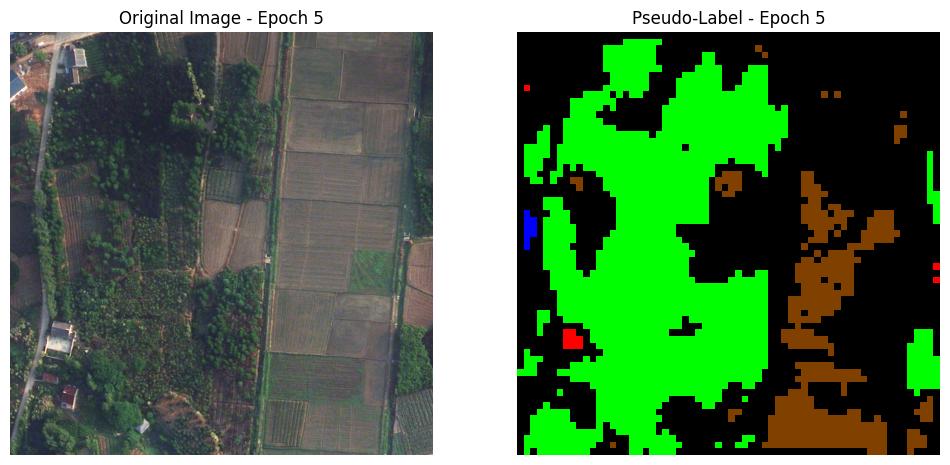

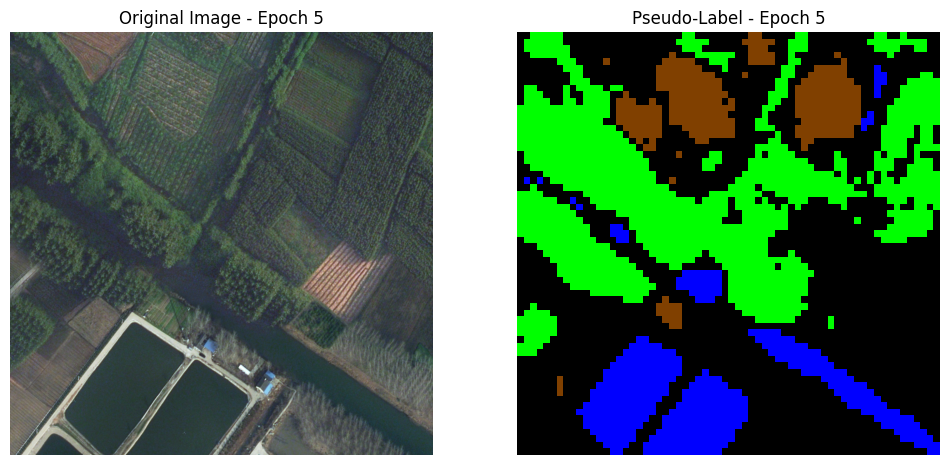

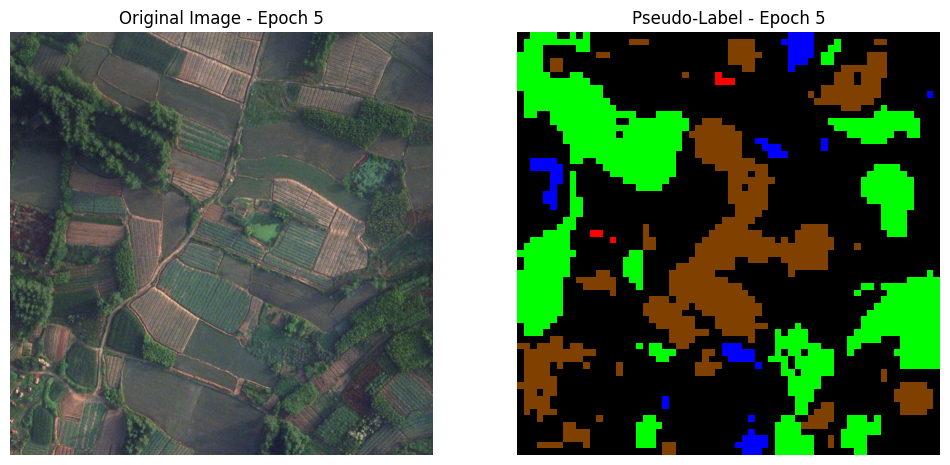

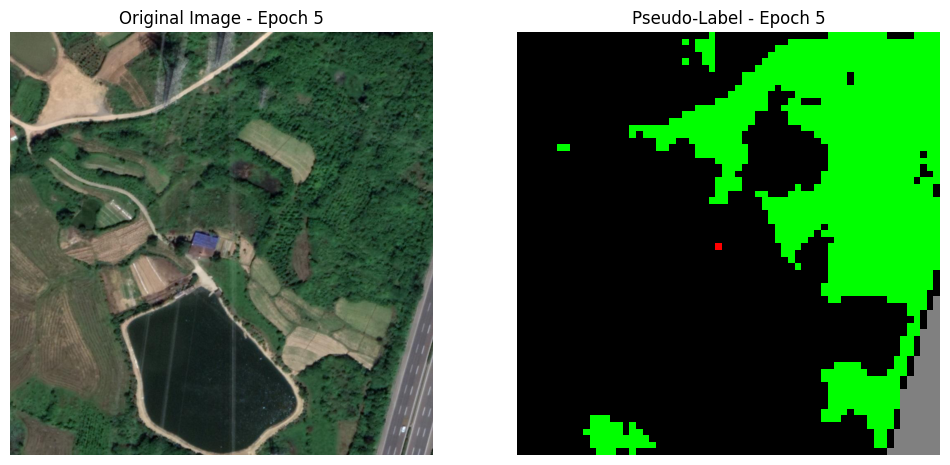

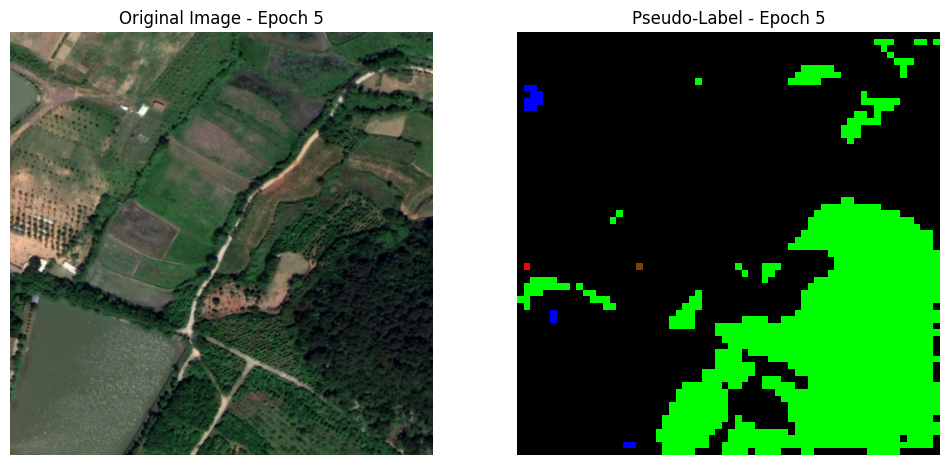

Loading pseudo-labels for epoch 10...
Visualizing pseudo-labels for epoch 10...


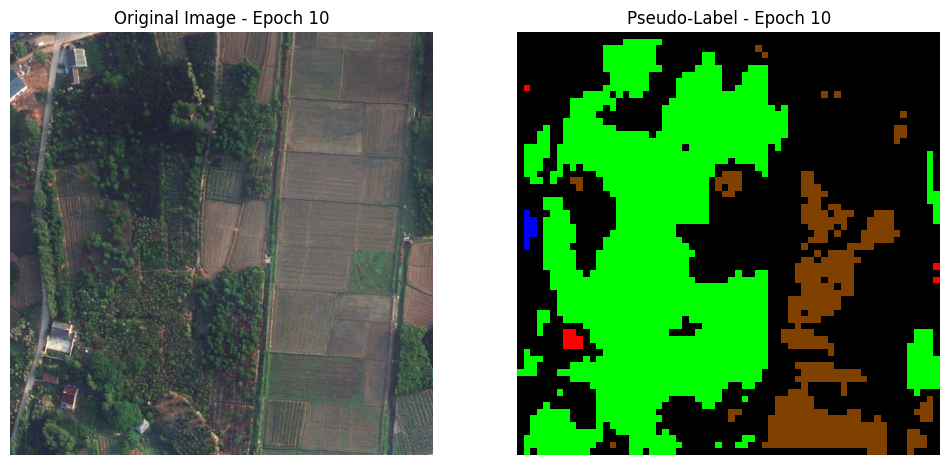

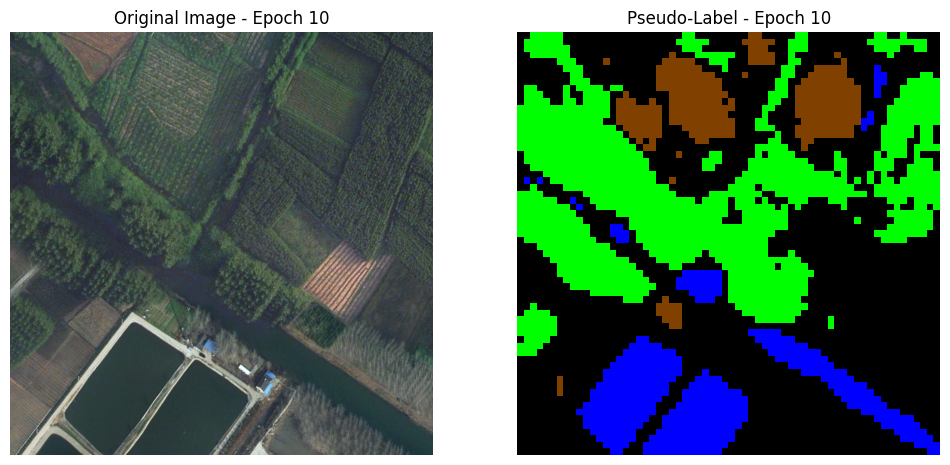

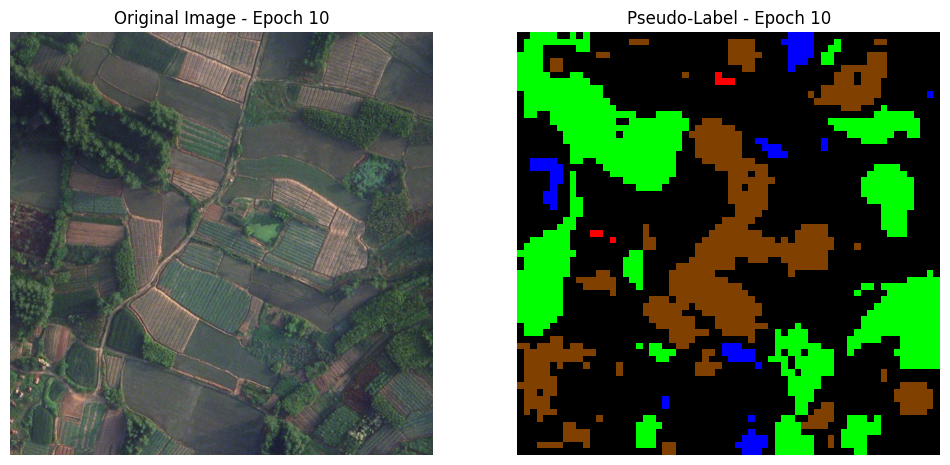

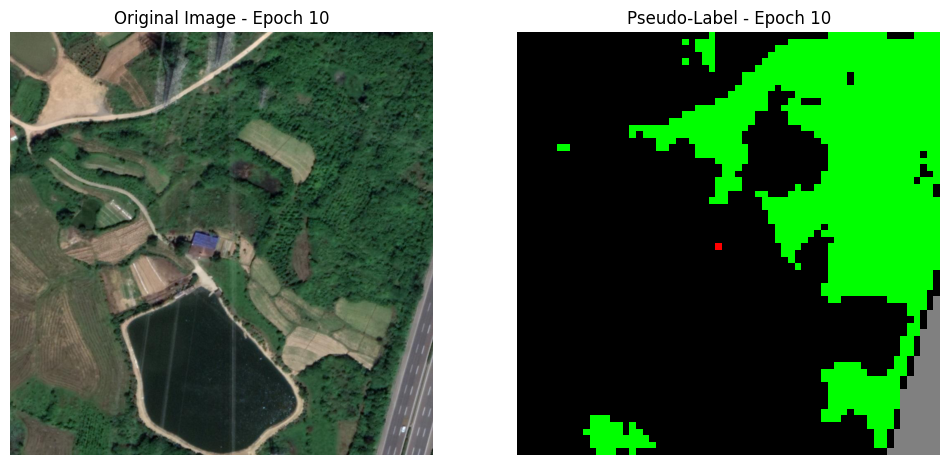

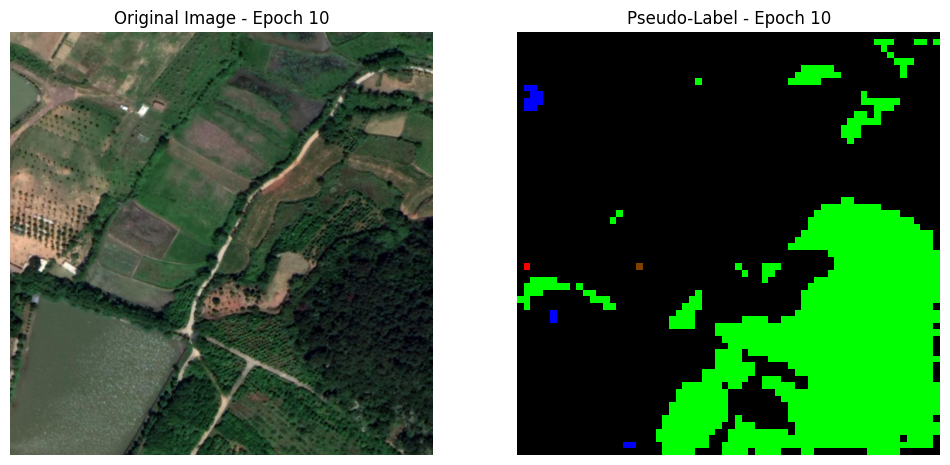

Loading pseudo-labels for epoch 15...
Visualizing pseudo-labels for epoch 15...


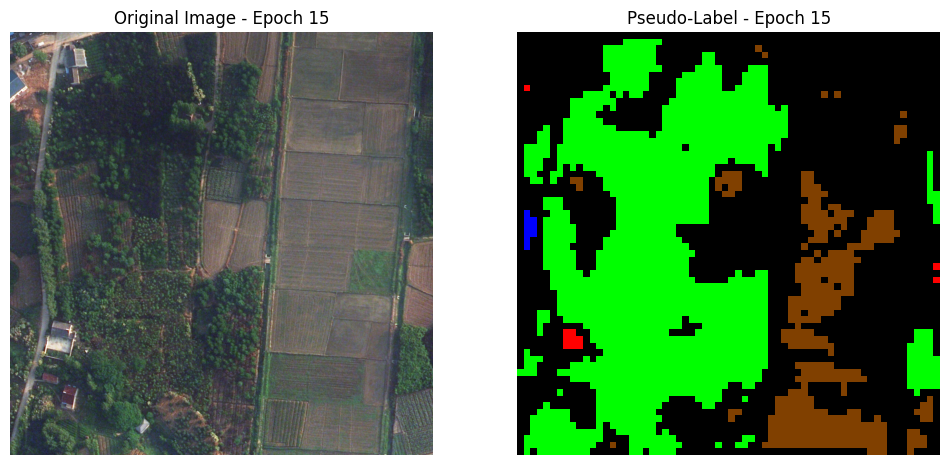

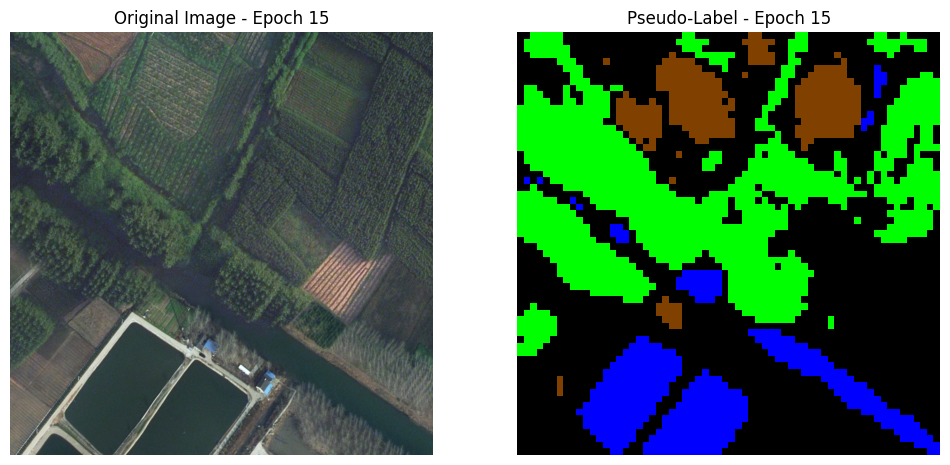

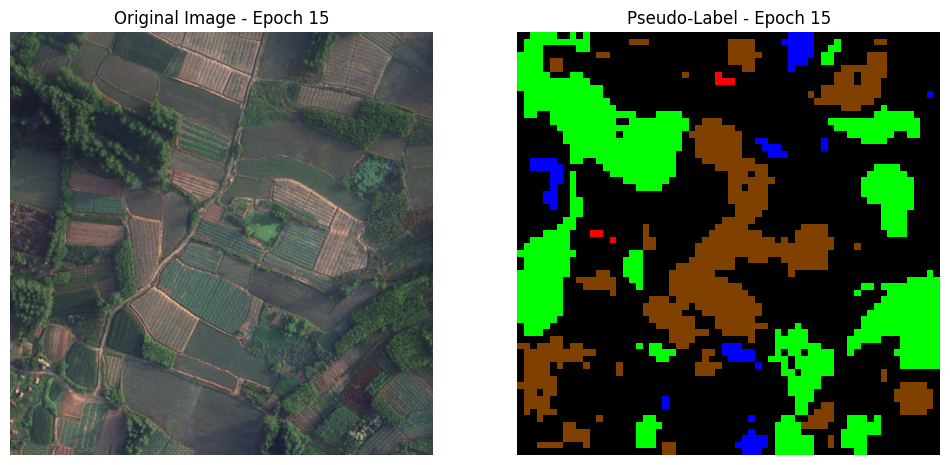

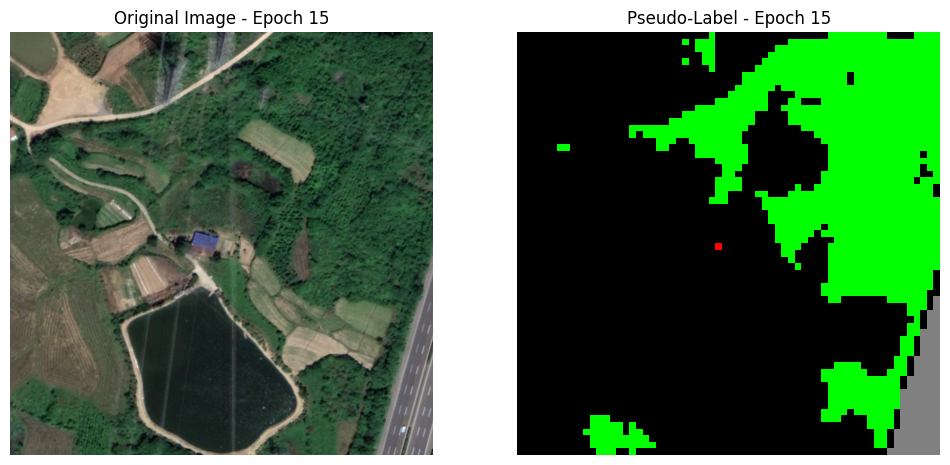

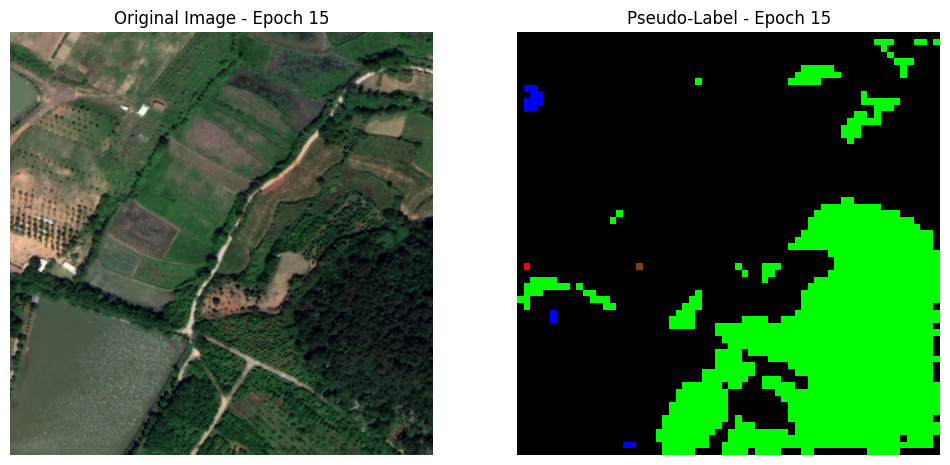

Loading pseudo-labels for epoch 20...
Visualizing pseudo-labels for epoch 20...


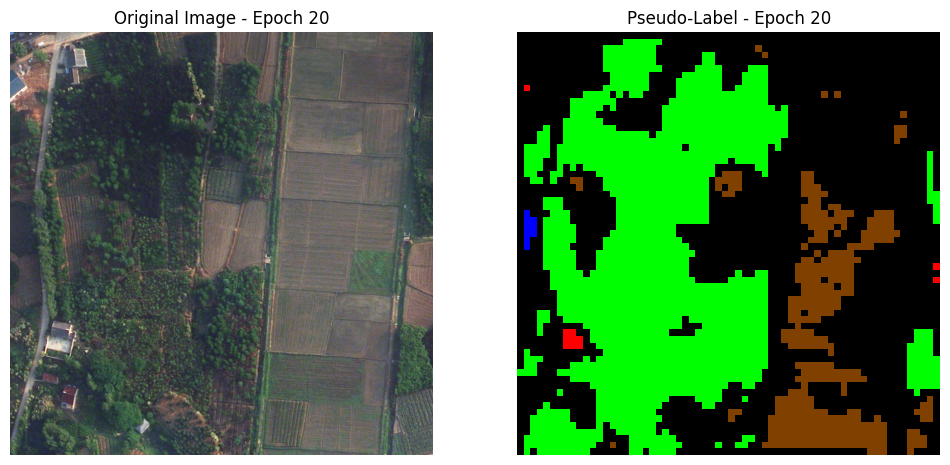

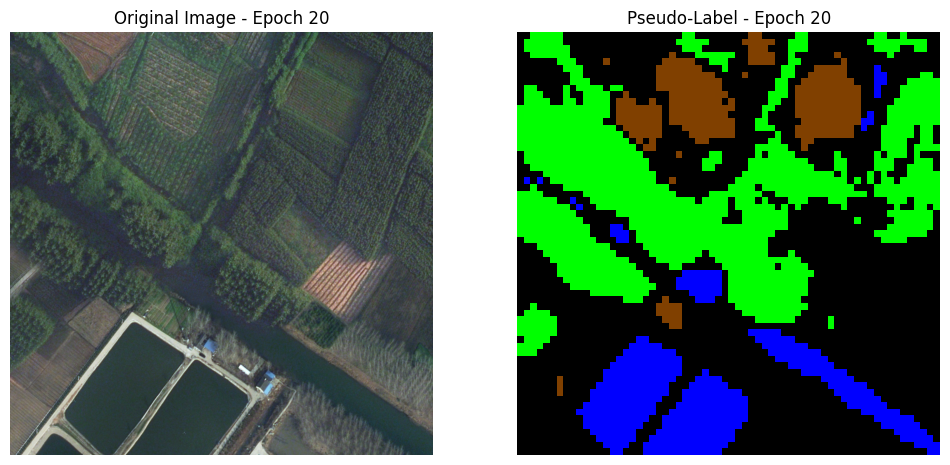

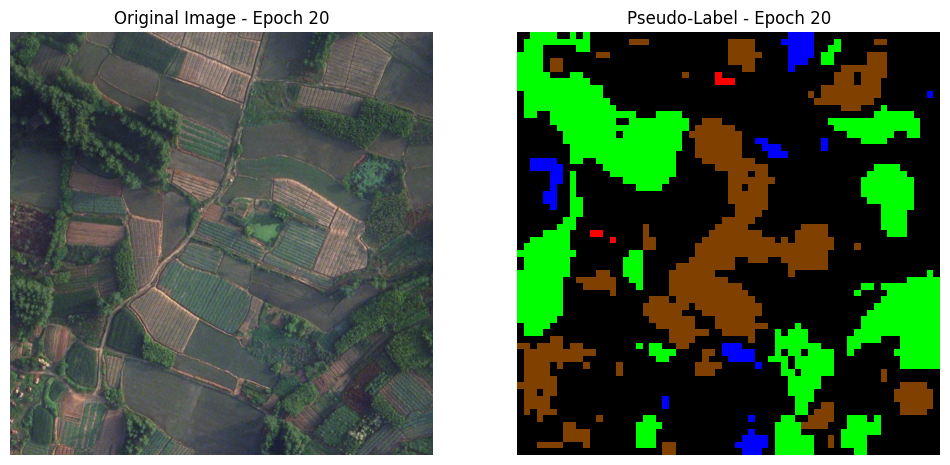

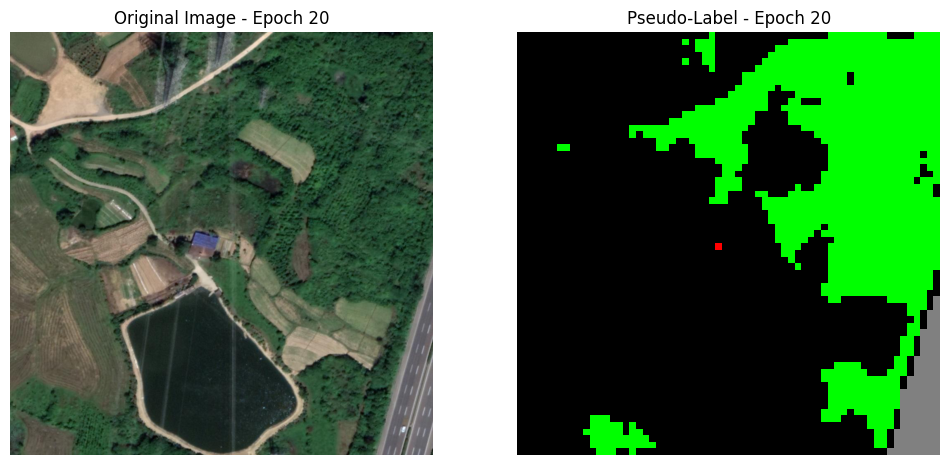

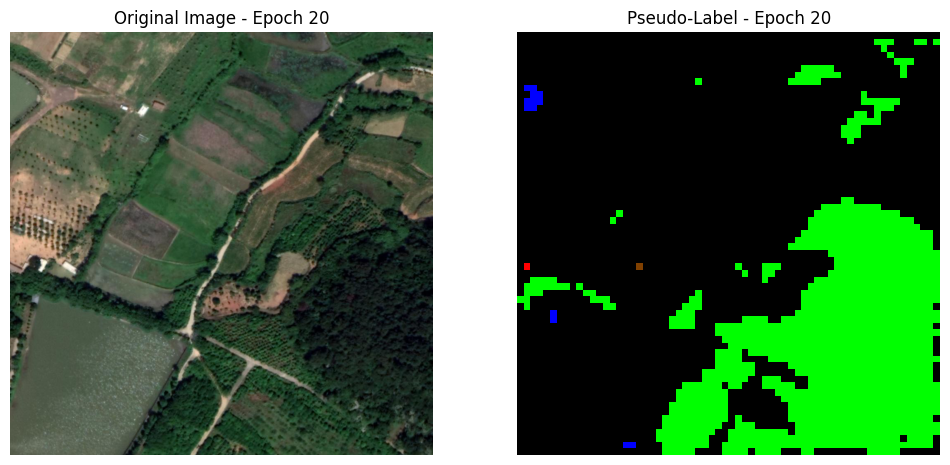

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os

class_labels = ["background", "building", "road", "water", "barren", "forest", "agriculture"]
label_colors = {
    "background": (0, 0, 0),
    "building": (255, 0, 0),
    "road": (128, 128, 128),
    "water": (0, 0, 255),
    "barren": (255, 255, 0),
    "forest": (0, 255, 0),
    "agriculture": (128, 64, 0),
}

# Path to target images
target_image_dir = '/content/PIDNet/LoveDA/Train/Rural/images_png'
image_list = os.listdir(target_image_dir)
image_list.sort()

# Iterate over pseudo-labels generated at every 5 epochs
for epoch in range(5, 21, 5):
    pseudo_label_path = f'pseudo_labels_epoch_{epoch}.pth'

    # Check if the pseudo-label file exists
    if not os.path.exists(pseudo_label_path):
        print(f"Pseudo-label file for epoch {epoch} not found: {pseudo_label_path}")
        continue

    print(f"Loading pseudo-labels for epoch {epoch}...")
    pseudo_labels = torch.load(pseudo_label_path)
    pseudo_labels = np.array(pseudo_labels)

    # Visualize a few images and their pseudo-labels for this epoch
    print(f"Visualizing pseudo-labels for epoch {epoch}...")
    for i in range(5):

        image_name = image_list[i]
        image_path = os.path.join(target_image_dir, image_name)
        image = Image.open(image_path).convert('RGB')

        pseudo_label = pseudo_labels[i]
        pseudo_label = np.array(pseudo_label, dtype=np.uint8)

        pseudo_label_image = np.zeros((pseudo_label.shape[0], pseudo_label.shape[1], 3), dtype=np.uint8)
        for label_index, label_name in enumerate(class_labels):
            color = label_colors[label_name]
            pseudo_label_image[pseudo_label == label_index] = color

        # Display the original image and the pseudo-label image side-by-side
        plt.figure(figsize=(12, 6))
        plt.subplot(1, 2, 1)
        plt.imshow(image)
        plt.title(f"Original Image - Epoch {epoch}")
        plt.axis("off")

        plt.subplot(1, 2, 2)
        plt.imshow(pseudo_label_image)
        plt.title(f"Pseudo-Label - Epoch {epoch}")
        plt.axis("off")

        plt.show()


In [ ]:
def generate_full_classmix_mask(source_label):

    # Generate binary mask for full-class mixing
    mask = torch.rand_like(source_label, dtype=torch.float32) > 0.5
    return mask


In [ ]:
def mix_images_and_labels(source_image, source_label, target_image, target_label, mask):
    """
    Mix source and target images and labels based on the binary mask.
    :param source_image: Source image (CxHxW)
    :param source_label: Source label (HxW)
    :param target_image: Target image (CxHxW)
    :param target_label: Target label (HxW)
    :param mask: Binary mask (HxW)
    :return: Mixed image and mixed label
    """
    mixed_image = source_image.clone()
    mixed_label = source_label.clone()

    # Apply mask to mix source and target
    mixed_image[:, mask] = target_image[:, mask]
    mixed_label[mask] = target_label[mask]

    return mixed_image, mixed_label


In [ ]:
import torch
import torch.nn.functional as F
from torch.utils.data import Dataset

class MixedLoveDADataset(Dataset):
    def __init__(self, source_dataset, target_dataset, pseudo_labels, num_classes, transform=None):
        """
        Initializes the MixedLoveDADataset, combining source dataset with labeled data
        and target dataset with pseudo-labels.

        Args:
            source_dataset (Dataset): Source domain dataset with ground truth labels.
            target_dataset (Dataset): Target domain dataset without ground truth labels.
            pseudo_labels (list): Pseudo-labels for the target domain dataset.
            num_classes (int): Number of classes in the dataset.
            transform (callable, optional): Transformations to apply to the images.
        """
        self.source_dataset = source_dataset
        self.target_dataset = target_dataset
        self.pseudo_labels = pseudo_labels
        self.num_classes = num_classes
        self.transform = transform

    def __len__(self):
        return len(self.source_dataset) + len(self.target_dataset)

    def __getitem__(self, idx):

        if idx < len(self.source_dataset):
            # Fetch from source dataset
            image, mask = self.source_dataset[idx]
            if self.transform:
                image = self.transform(image)
            return image, mask
        else:
            # Fetch from target dataset
            target_idx = idx - len(self.source_dataset)
            image, _ = self.target_dataset[target_idx]  # Ignore ground truth labels

            pseudo_label = self.pseudo_labels[target_idx]


            pseudo_label = torch.tensor(pseudo_label, dtype=torch.long).clamp(0, self.num_classes - 1)

            pseudo_label = F.interpolate(
                pseudo_label.unsqueeze(0).unsqueeze(0).float(),
                size=(image.shape[1], image.shape[2]),
                mode='nearest'
            ).squeeze().long()

            if self.transform:
                image = self.transform(image)

            return image, pseudo_label


In [ ]:
import zipfile

val_zip_path = '/content/drive/MyDrive/Val.zip'
output_dir = './LoveDA'

def extract_with_progress(zip_path, output_dir):
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        total_files = len(zip_ref.namelist())
        print(f"Extracting {total_files} files...")
        for i, file in enumerate(zip_ref.namelist(), start=1):
            zip_ref.extract(file, output_dir)
            if i % (total_files // 10) == 0 or i == total_files:
                print(f"Progress: {int((i / total_files) * 100)}% done")
    print("Data unzipped successfully!")

extract_with_progress(val_zip_path, output_dir)


Extracting 3345 files...
Progress: 9% done
Progress: 19% done
Progress: 29% done
Progress: 39% done
Progress: 49% done
Progress: 59% done
Progress: 69% done
Progress: 79% done
Progress: 89% done
Progress: 99% done
Progress: 100% done
Data unzipped successfully!


In [ ]:
from torchvision.transforms import ToTensor
from torchvision import transforms
from albumentations.pytorch import ToTensorV2

evaluation_transform = Compose([
    Resize(512,512),
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225], always_apply=True),
    ToTensorV2()
])

val_dataset = LoveDADataset(root='/content/PIDNet/LoveDA', split='Val', region='Rural', transform=evaluation_transform)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False, num_workers=2)

In [ ]:
import torch
import torch.nn.functional as F
from torch.utils.data import DataLoader

def calculate_iou(predictions, ground_truth, num_classes):
    """
    Calculate IoU for each class.

    Args:
        predictions (torch.Tensor): Tensor of predicted labels.
        ground_truth (torch.Tensor): Tensor of ground truth labels.
        num_classes (int): Total number of classes.

    Returns:
        list: List of IoU for each class.
    """
    classwise_iou = []
    for cls in range(num_classes):
        tp = ((predictions == cls) & (ground_truth == cls)).sum().item()
        fp = ((predictions == cls) & (ground_truth != cls)).sum().item()
        fn = ((predictions != cls) & (ground_truth == cls)).sum().item()

        if tp + fp + fn == 0:
            iou = float('nan')
        else:
            iou = tp / (tp + fp + fn)
        classwise_iou.append(iou)

    return classwise_iou

def mean_iou(classwise_iou):

    valid_ious = [iou for iou in classwise_iou if not torch.isnan(torch.tensor(iou))]
    return sum(valid_ious) / len(valid_ious) if valid_ious else 0

# Define the DataLoader
from torch.utils.data import DataLoader
num_classes = 7
mixed_dataset = MixedLoveDADataset(
    source_dataset=source_dataset,
    target_dataset=target_dataset,
    pseudo_labels=pseudo_labels,
    num_classes=num_classes
)

# Assuming mixed_dataset is already defined
mixed_loader = DataLoader(
    mixed_dataset, batch_size=8, shuffle=True, num_workers=4, pin_memory=True
)

# Training and validation
model.train()
num_epochs = 20
num_classes = 7
class_labels = ["background", "building", "road", "water", "barren", "forest", "agriculture"]
# Lists to store metrics per epoch
epoch_train_miou = []  # Training mIoU per epoch
epoch_val_miou = []    # Validation mIoU per epoch
epoch_train_loss = []  # Training loss per epoch
epoch_val_loss = []    # Validation loss per epoch

# Training and validation loop
for epoch in range(num_epochs):
    # Training
    model.train()
    train_loss = 0.0
    all_train_predictions = []
    all_train_ground_truth = []

    for images, masks in mixed_loader:
        images, masks = images.to(device), masks.to(device)
        outputs = model(images)[0]
        masks = F.interpolate(masks.unsqueeze(1).float(), size=outputs.shape[2:], mode='nearest').squeeze(1).long()
        masks = masks.clamp(0, num_classes - 1)

        # Compute loss
        loss = criterion(outputs, masks)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item()

        # Collect predictions and ground truth for IoU
        _, predicted = torch.max(outputs, 1)
        all_train_predictions.append(predicted.cpu())
        all_train_ground_truth.append(masks.cpu())
    #scheduler.step()     #???????????????????????????????????????????????????????????????????????????????
    train_loss /= len(mixed_loader)
    print(f"Epoch {epoch+1}/{num_epochs}, Training Loss: {train_loss:.4f}")

    # Calculate training IoU
    train_predictions = torch.cat(all_train_predictions, dim=0)
    train_ground_truth = torch.cat(all_train_ground_truth, dim=0)
    train_iou = calculate_iou(train_predictions, train_ground_truth, num_classes)
    mean_train_iou = mean_iou(train_iou)

    # Append training metrics
    epoch_train_loss.append(train_loss)
    epoch_train_miou.append(mean_train_iou)

    # Validation
    model.eval()
    all_predictions = []
    all_ground_truth = []
    val_loss = 0.0

    with torch.no_grad():
        for val_images, val_masks in val_loader:
            val_images, val_masks = val_images.to(device), val_masks.to(device)
            outputs = model(val_images)[0]
            val_masks = F.interpolate(val_masks.unsqueeze(1).float(), size=outputs.shape[2:], mode='nearest').squeeze(1).long()
            val_masks = val_masks.clamp(0, num_classes - 1)

            # Compute loss
            loss = criterion(outputs, val_masks)
            val_loss += loss.item()

            _, predicted = torch.max(outputs, 1)
            all_predictions.append(predicted.cpu())
            all_ground_truth.append(val_masks.cpu())

    val_loss /= len(val_loader)
    print(f"Epoch {epoch+1}/{num_epochs}, Validation Loss: {val_loss:.4f}")

    # Calculate IoU for validation
    predictions = torch.cat(all_predictions, dim=0)
    ground_truth = torch.cat(all_ground_truth, dim=0)
    iou = calculate_iou(predictions, ground_truth, num_classes)
    mean_iou_value = mean_iou(iou)

    # Append validation metrics
    epoch_val_loss.append(val_loss)
    epoch_val_miou.append(mean_iou_value)

    # Print validation IoU
    print(f"Validation IoU for Epoch {epoch+1}:")
    for cls, iou_value in enumerate(iou):
        label = class_labels[cls] if cls < len(class_labels) else f"Class {cls}"
        if torch.isnan(torch.tensor(iou_value)):
            print(f"Class {label}: IoU = NaN")
        else:
            print(f"Class {label}: IoU = {iou_value:.4f}")

    # Print mean IoU
    print(f"Mean IoU for Epoch {epoch+1}: {mean_iou_value:.4f}")

    # Save the model checkpoint
    torch.save(model.state_dict(), f'mixed_dataset_model_epoch_{epoch+1}.pth')


/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch 1/20, Training Loss: 0.8602
Epoch 1/20, Validation Loss: 2.2285
Validation IoU for Epoch 1:
Class background: IoU = 0.3907
Class building: IoU = 0.3487
Class road: IoU = 0.2724
Class water: IoU = 0.1812
Class barren: IoU = 0.0138
Class forest: IoU = 0.1349
Class agriculture: IoU = 0.0846
Mean IoU for Epoch 1: 0.2038
Epoch 2/20, Training Loss: 0.6008
Epoch 2/20, Validation Loss: 2.3194
Validation IoU for Epoch 2:
Class background: IoU = 0.3964
Class building: IoU = 0.2427
Class road: IoU = 0.2749
Class water: IoU = 0.1724
Class barren: IoU = 0.0653
Class forest: IoU = 0.1448
Class agriculture: IoU = 0.0928
Mean IoU for Epoch 2: 0.1985
Epoch 3/20, Training Loss: 0.5475
Epoch 3/20, Validation Loss: 2.5418
Validation IoU for Epoch 3:
Class background: IoU = 0.4186
Class building: IoU = 0.4172
Class road: IoU = 0.2560
Class water: IoU = 0.1670
Class barren: IoU = 0.0225
Class forest: IoU = 0.1508
Class agriculture: IoU = 0.0744
Mean IoU for Epoch 3: 0.2152
Epoch 4/20, Training Loss: 0

In [ ]:
"resize evaluation and pesuod labels are refined and 20 epoch"

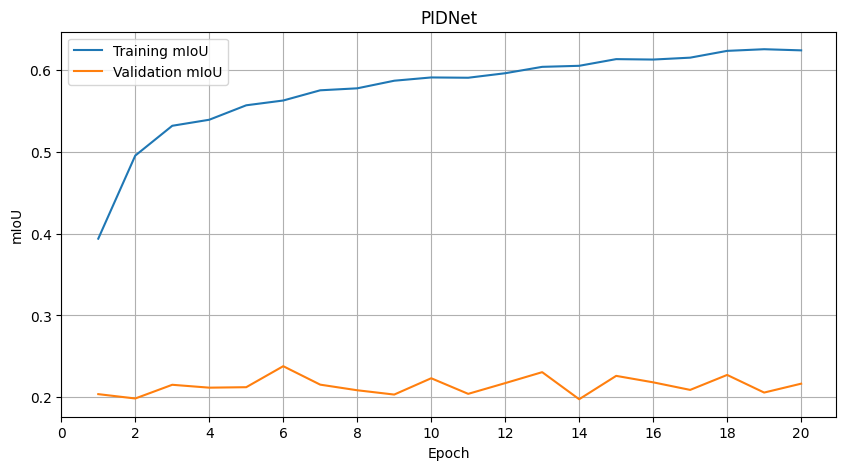

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
plt.plot(range(1, num_epochs + 1), epoch_train_miou, label='Training mIoU')
plt.plot(range(1, num_epochs + 1), epoch_val_miou, label='Validation mIoU')
plt.xlabel('Epoch')
plt.ylabel('mIoU')
plt.title('PIDNet')
plt.legend()
plt.grid(True)
plt.xticks(range(0, num_epochs + 2, 2))
plt.show()

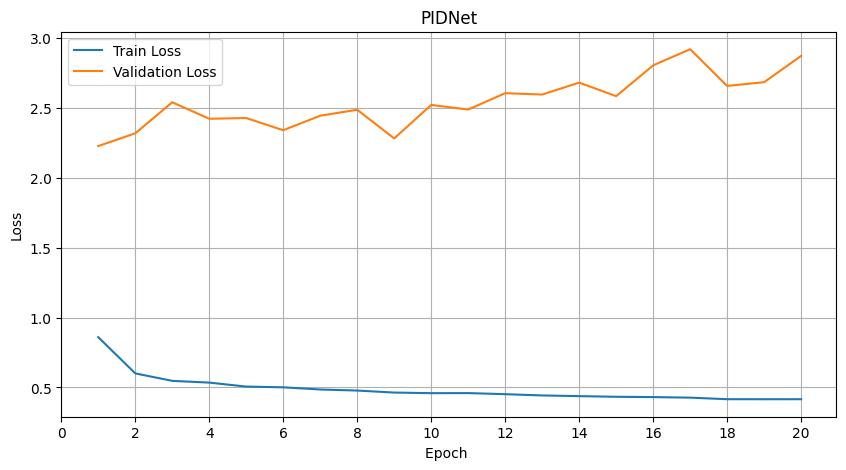

In [ ]:
plt.figure(figsize=(10, 5))
plt.plot(range(1, num_epochs + 1), epoch_train_loss, label="Train Loss")
plt.plot(range(1, num_epochs + 1), epoch_val_loss, label="Validation Loss")
plt.xlabel("Epoch ")
plt.ylabel("Loss")
plt.title("PIDNet")
plt.legend()
plt.grid(True)
plt.xticks(range(0, num_epochs + 2, 2))
plt.show()

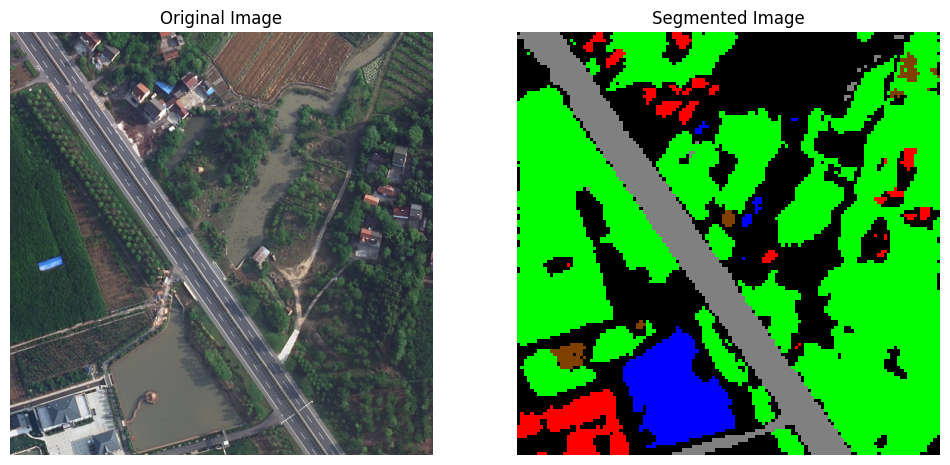

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os

# Define label colors (R, G, B) for each class
class_labels = ["background", "building", "road", "water", "barren", "forest", "agriculture"]
label_colors = {
    "background": (0, 0, 0),        # Black
    "building": (255, 0, 0),       # Red
    "road": (128, 128, 128),       # Gray
    "water": (0, 0, 255),          # Blue
    "barren": (255, 255, 0),       # Yellow
    "forest": (0, 255, 0),         #Green
    "agriculture": (128, 64, 0),   # Brown
}

# Load a single image for segmentation
image_path = "/content/PIDNet/LoveDA/Test/Rural"
image_files = [f for f in os.listdir(image_path) if os.path.isfile(os.path.join(image_path, f)) and not f.startswith('.')]
image_name = image_files[0]
image = Image.open(os.path.join(image_path, image_name)).convert('RGB')



transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
input_image = transform(image).unsqueeze(0).to(device)

# Perform inference with the model
model.eval()
with torch.no_grad():
    output = model(input_image)
    output = output[0]
    preds = torch.argmax(output, dim=1).squeeze(0).cpu().numpy()

segmentation_map = np.zeros((preds.shape[0], preds.shape[1], 3), dtype=np.uint8)

for label_index, label_name in enumerate(class_labels):
    color = label_colors[label_name]
    segmentation_map[preds == label_index] = color

# Visualize the original image and segmentation map
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(segmentation_map)
plt.title("Segmented Image")
plt.axis("off")

plt.show()